# maxvogt-analysis: Uzwil

The code in this notebook is based on [Martin Fleischmann's](https://martinfleischmann.net/) 2021 workshop [*Capturing the Structure of Cities with Data Science (SDSC)*](https://github.com/martinfleis/sdsc21-workshop), licensed under the [CC BY-SA 4.0 license](https://creativecommons.org/licenses/by-sa/4.0/). © 2021 Martin Fleischmann.

The geodata in this notebook is retrieved from OpenStreetMap. © OpenStreetMap Contributors.

<hr>

This notebook contains geodata and analyses for the following items of the [Max Vogt collection](https://mtwente.github.io/maxvogt/) by Moritz Twente and Luisa Omonsky:
- [UZW031](https://mtwente.github.io/maxvogt/items/uzw031.html)

<hr>

Open in an interactive in-browser environment: 

[![Binder](https://mybinder.org/badge_logo.svg)](https://mybinder.org/v2/gh/mtwente/maxvogt-analysis/main?labpath=analysis%2Fuzwil.ipynb)

In [1]:
import warnings

import geopandas
import libpysal
import momepy
import osmnx
import pandas

from clustergram import Clustergram

import matplotlib.pyplot as plt
from bokeh.io import output_notebook
from bokeh.plotting import show

Pick a place, ideally a town with a good coverage in OpenStreetMap and its local CRS.

In [2]:
place = 'Uzwil'
point = 47.43833, 9.13114
address = 'Friedbergstrasse 4, 9240 Uzwil'
dist = 2000
local_crs = 'EPSG:2056'

In [3]:
geopandas.tools.geocode(address).explore()

## Input data

Download data from OpenStreetMap.

### Buildings

In [4]:
#buildings = osmnx.features.features_from_place(place, tags={'building':True})
#buildings = osmnx.features.features_from_address(address, tags={'building':True}, dist=dist)
buildings = osmnx.features.features_from_point(point, tags={'building':True}, dist=dist)

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)


In [5]:
buildings

geometry  \
element_type osmid                                                           
node         2026606573                           POINT (9.11854 47.45105)   
way          29267506    POLYGON ((9.14111 47.44097, 9.14118 47.44080, ...   
             29377732    POLYGON ((9.14092 47.44120, 9.14094 47.44116, ...   
             33116907    POLYGON ((9.12976 47.44063, 9.12965 47.44059, ...   
             33117511    POLYGON ((9.13114 47.43795, 9.13112 47.43805, ...   
...                                                                    ...   
             1218301457  POLYGON ((9.14675 47.44494, 9.14676 47.44495, ...   
             1218306385  POLYGON ((9.13782 47.43418, 9.13784 47.43407, ...   
             1266756019  POLYGON ((9.12026 47.44209, 9.12029 47.44215, ...   
             1314294669  POLYGON ((9.13553 47.42284, 9.13557 47.42281, ...   
relation     16391142    POLYGON ((9.12068 47.42941, 9.12076 47.42951, ...   

                        amenity operator operator:wikidata        building  \
element_type osmid                                                           
node         2026606573     NaN      NaN               NaN  wayside_shrine   
way          29267506       NaN      NaN               NaN             yes   
             29377732       NaN      NaN               NaN             yes   
             33116907       NaN      NaN               NaN             yes   
             33117511       NaN      NaN               NaN      commercial   
...                         ...      ...               ...             ...   
             1218301457     NaN      NaN               NaN      apartments   
             1218306385     NaN      NaN               NaN    construction   
             1266756019     NaN      NaN               NaN      apartments   
             1314294669     NaN      NaN               NaN             yes   
relation     16391142       NaN      NaN               NaN          school   

                        brand brand:wikidata check_date access wheelchair  \
element_type osmid                                                          
node         2026606573   NaN            NaN        NaN    NaN        NaN   
way          29267506     NaN            NaN        NaN    NaN    limited   
             29377732     NaN            NaN        NaN    NaN        NaN   
             33116907     NaN            NaN        NaN    NaN        NaN   
             33117511     NaN            NaN        NaN    NaN        NaN   
...                       ...            ...        ...    ...        ...   
             1218301457   NaN            NaN        NaN    NaN        NaN   
             1218306385   NaN            NaN        NaN    NaN        NaN   
             1266756019   NaN            NaN        NaN    NaN        NaN   
             1314294669   NaN            NaN        NaN    NaN        NaN   
relation     16391142     NaN            NaN        NaN    NaN        NaN   

                         ... nohousenumber bench shelter_type  \
element_type osmid       ...                                    
node         2026606573  ...           NaN   NaN          NaN   
way          29267506    ...           NaN   NaN          NaN   
             29377732    ...           NaN   NaN          NaN   
             33116907    ...           NaN   NaN          NaN   
             33117511    ...           NaN   NaN          NaN   
...                      ...           ...   ...          ...   
             1218301457  ...           NaN   NaN          NaN   
             1218306385  ...           NaN   NaN          NaN   
             1266756019  ...           NaN   NaN          NaN   
             1314294669  ...           NaN   NaN          NaN   
relation     16391142    ...           NaN   NaN          NaN   

                        healthcare:speciality construction operator:type  \
element_type osmid                                                         
node         2026606573             

In [6]:
buildings.geom_type.value_counts()

Polygon    4745
Point         1
Name: count, dtype: int64

In [7]:
buildings = buildings[buildings.geom_type == "Polygon"].reset_index(drop=True)

In [8]:
buildings = buildings[["geometry"]].to_crs(local_crs)

In [9]:
buildings["uID"] = range(len(buildings))

In [10]:
buildings

,geometry,uID
0,"POLYGON ((2728410.409 1255857.145, 2728416.490...",0
1,"POLYGON ((2728395.808 1255882.284, 2728397.149...",1
2,"POLYGON ((2727555.457 1255800.917, 2727547.587...",2
3,"POLYGON ((2727666.340 1255504.975, 2727664.106...",3
4,"POLYGON ((2727414.335 1255277.901, 2727414.119...",4
...,...,...
4740,"POLYGON ((2728826.188 1256307.202, 2728826.918...",4740
4741,"POLYGON ((2728179.294 1255096.491, 2728180.902...",4741
4742,"POLYGON ((2726835.579 1255947.773, 2726837.510...",4742
4743,"POLYGON ((2728033.843 1253831.931, 2728036.391...",4743


### Streets

In comparison to Martin Fleischmann's workshop, I here set `truncate_by_edge` to be `True`.
Depending on the OSM mapping quality of the place at hand, it might also be necessary to change the value of `network_type`. See [geopandas documentation](https://osmnx.readthedocs.io/en/stable/user-reference.html#osmnx.graph.graph_from_place) for options.

In [11]:
#osm_graph = osmnx.graph_from_place(place, network_type='drive', truncate_by_edge=True)
#osm_graph = osmnx.graph_from_address(place, network_type='drive', truncate_by_edge=True, dist=dist)
osm_graph = osmnx.graph_from_point(point, network_type='drive', truncate_by_edge=True, dist=dist)

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/osmnx/graph.py:191: FutureWarning: The expected order of coordinates in `bbox` will change in the v2.0.0 release to `(left, bottom, right, top)`.
  G = graph_from_bbox(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/predicates.py:798: RuntimeWarning: invalid value encountered in intersects
  return lib.intersects(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:340: RuntimeWarning: invalid value encountered in union
  return lib.union(a, b, **kwargs)


In [12]:
osm_graph = osmnx.projection.project_graph(osm_graph, to_crs=local_crs)

In [13]:
streets = osmnx.graph_to_gdfs(
    osm_graph, 
    nodes=False, 
    edges=True,
    node_geometry=False, 
    fill_edge_geometry=True
)

In [14]:
streets.explore()

In [15]:
streets

osmid  \
u           v          key                                                      
21539826    9372745921 0                               [20852433, 1316905861]   
9372745921  302012475  0                               [27509865, 1189812259]   
            201462174  0                      [195414496, 27509946, 20852173]   
21539840    201456424  0    [1092082146, 1092082147, 29244839, 29244840, 3...   
201456424   302009425  0                                             19375513   
...                                                                       ...   
5618120379  5618120380 0                                            588197331   
5658179788  5658179787 0                                            592984549   
11833150848 9025246940 0                                           1274439615   
9171512223  9171512222 0                                            992677694   
9519246430  9519246429 0                                           1033218509   

                            oneway   lanes  ref        highway   maxspeed  \
u           v          key                                                  
21539826    9372745921 0      True  [3, 2]   A1       motorway        120   
9372745921  302012475  0      True       1   A1  motorway_link  [60, 120]   
            201462174  0      True       2   A1       motorway        120   
21539840    201456424  0      True  [3, 2]   A1       motorway        120   
201456424   302009425  0      True       1   A1  motorway_link        NaN   
...                            ...     ...  ...            ...        ...   
5618120379  5618120380 0     False     NaN  NaN    residential        NaN   
5658179788  5658179787 0     False     NaN  NaN    residential        NaN   
11833150848 9025246940 0     False     NaN  NaN    residential        NaN   
9171512223  9171512222 0     False     NaN  NaN    residential        NaN   
9519246430  9519246429 0     False     NaN  NaN    residential        NaN   

                           reversed    length  \
u           v          key                      
21539826    9372745921 0      False   800.034   
9372745921  302012475  0      False   338.690   
            201462174  0      False   322.973   
21539840    201456424  0      False  3046.136   
201456424   302009425  0      False   327.197   
...                             ...       ...   
5618120379  5618120380 0       True    72.195   
5658179788  5658179787 0      False    24.534   
11833150848 9025246940 0      False    19.076   
9171512223  9171512222 0       True    82.725   
9519246430  9519246429 0       True     9.340   

                                                                     geometry  \
u           v          key                                                      
21539826    9372745921 0    LINESTRING (2730224.064 1256047.591, 2730153.4...   
9372745921  302012475  0    LINESTRING (2729586.366 1256528.735, 2729582.8...   
            201462174  0    LINESTRING (2729586.366 1256528.735, 2729521.8...   
21539840    201456424  0    LINESTRING (2726336.828 1258036.840, 2726386.8...   
201456424   302009425  0    LINESTRING (2729137.493 1256901.852, 2729141.7...   
...                                                                       ...   
5618120379  5618120380 0    LINESTRING (2726088.545 1256176.244, 2726102.8...   
5658179788  5658179787 0    LINESTRING (2727391.327 1255421.979, 2727413.7...   
11833150848 9025246940 0    LINESTRING (2728429.829 1255055.583, 2728428.3...   
9171512223  9171512222 0    LINESTRING (2727979.820 1255484.668, 2727983.3...   
9519246430  9519246429 0    LINESTRING (2728425.806 1256744.831, 2728421.7...   

                           bridge           name junction tunnel access width  
u           v          key                                                     
21539826    9372745921 0      NaN            NaN      NaN    NaN    NaN   NaN  
9372745921  302012475  0      NaN            NaN      NaN    NaN    NaN   NaN  
    

In [16]:
streets = momepy.remove_false_nodes(streets)
streets = streets[["geometry"]]
streets["nID"] = range(len(streets))

In [17]:
streets

,geometry,nID
0,"LINESTRING (2730224.064 1256047.591, 2730153.4...",0
1,"LINESTRING (2729586.366 1256528.735, 2729582.8...",1
2,"LINESTRING (2729586.366 1256528.735, 2729521.8...",2
3,"LINESTRING (2726336.828 1258036.840, 2726386.8...",3
4,"LINESTRING (2729137.493 1256901.852, 2729141.7...",4
...,...,...
1380,"LINESTRING (2729592.878 1256570.693, 2729790.7...",1380
1381,"LINESTRING (2729599.612 1254987.460, 2729618.6...",1381
1382,"LINESTRING (2729409.916 1256397.713, 2729415.7...",1382
1383,"LINESTRING (2729472.416 1253845.323, 2729483.7...",1383


## Generated data

### Tessellation

We can generate a spatail unit using Voronoi tessellation with given building footprints.

In [18]:
limit = momepy.buffered_limit(buildings, 100)

tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
tessellation = tessellation.tessellation

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:426: RuntimeWarning: invalid value encountered in unary_union
  return lib.unary_union(collections, **kwargs)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/1328706492.py:3: FutureWarning: Class based API like `momepy.Tessellation` is deprecated. Replace it with `momepy.morphological_tessellation` or `momepy.enclosed_tessellation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation = momepy.Tessellation(buildings, "uID", limit, verbose=False, segment=1)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/constructive.py:181: RuntimeWarning: invalid value encountered in buffer
  return lib.buffer(
/Users/mtwente/anaconda3/envs/m

### Link streets

Link unique IDs of streets to buildings and tessellation cells based on the nearest neighbor join.

In [19]:
buildings = buildings.sjoin_nearest(streets, max_distance=1000, how="left")

In [20]:
buildings

,geometry,uID,index_right,nID
0,"POLYGON ((2728410.409 1255857.145, 2728416.490...",0,158,158
0,"POLYGON ((2728410.409 1255857.145, 2728416.490...",0,150,150
1,"POLYGON ((2728395.808 1255882.284, 2728397.149...",1,158,158
1,"POLYGON ((2728395.808 1255882.284, 2728397.149...",1,150,150
2,"POLYGON ((2727555.457 1255800.917, 2727547.587...",2,230,230
...,...,...,...,...
4740,"POLYGON ((2728826.188 1256307.202, 2728826.918...",4740,1363,1363
4741,"POLYGON ((2728179.294 1255096.491, 2728180.902...",4741,1334,1334
4742,"POLYGON ((2726835.579 1255947.773, 2726837.510...",4742,1258,1258
4743,"POLYGON ((2728033.843 1253831.931, 2728036.391...",4743,1315,1315


In [21]:
buildings = buildings.drop_duplicates("uID").drop(columns="index_right")

In [22]:
tessellation = tessellation.merge(buildings[['uID', 'nID']], on='uID', how='left')

## Measure

Measure individual morphometric characters.

### Dimensions

In [23]:
buildings["area"] = buildings.area
tessellation["area"] = tessellation.area
streets["length"] = streets.length

### Shape

In [24]:
buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/1902756608.py:1: FutureWarning: Class based API like `momepy.EquivalentRectangularIndex` is deprecated. Replace it with `momepy.equivalent_rectangular_index` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['eri'] = momepy.EquivalentRectangularIndex(buildings).series
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in oriented_envelope
  return getattr(ufunc, method)(*new_inputs, **kwargs)


In [25]:
buildings['elongation'] = momepy.Elongation(buildings).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/3723954296.py:1: FutureWarning: Class based API like `momepy.Elongation` is deprecated. Replace it with `momepy.elongation` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['elongation'] = momepy.Elongation(buildings).series
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in oriented_envelope
  return getattr(ufunc, method)(*new_inputs, **kwargs)


In [26]:
tessellation['convexity'] = momepy.Convexity(tessellation).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/2335586521.py:1: FutureWarning: Class based API like `momepy.Convexity` is deprecated. Replace it with `momepy.convexity` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation['convexity'] = momepy.Convexity(tessellation).series


In [27]:
streets["linearity"] = momepy.Linearity(streets).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/3802614628.py:1: FutureWarning: Class based API like `momepy.Linearity` is deprecated. Replace it with `momepy.linearity` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  streets["linearity"] = momepy.Linearity(streets).series


/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/IPython/core/pylabtools.py:77: DeprecationWarning: backend2gui is deprecated since IPython 8.24, backends are managed in matplotlib and can be externally registered.
  warnings.warn(


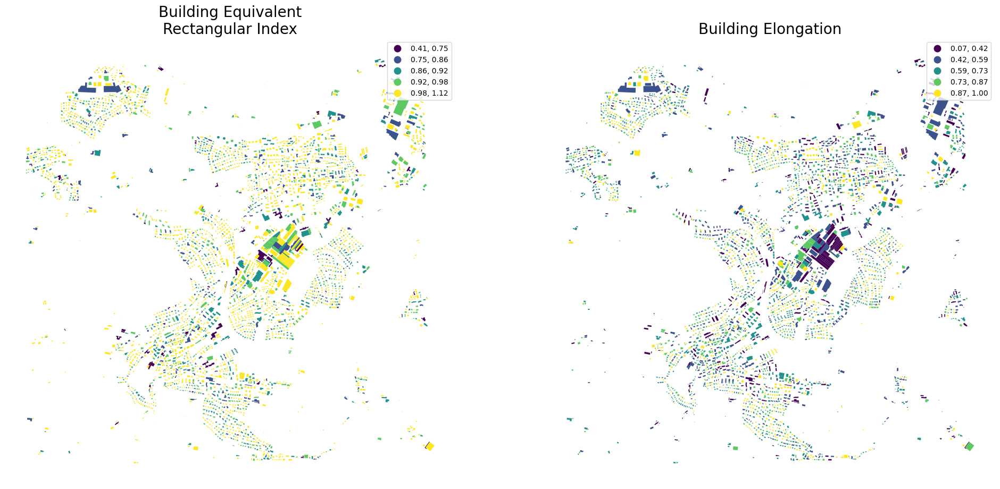

In [28]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("eri", ax=ax[0], scheme="natural_breaks", legend=True)
buildings.plot("elongation", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Building Equivalent\nRectangular Index', fontsize=20)
ax[1].set_title('Building Elongation', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Uzwil/eri_and_elongation.svg')  

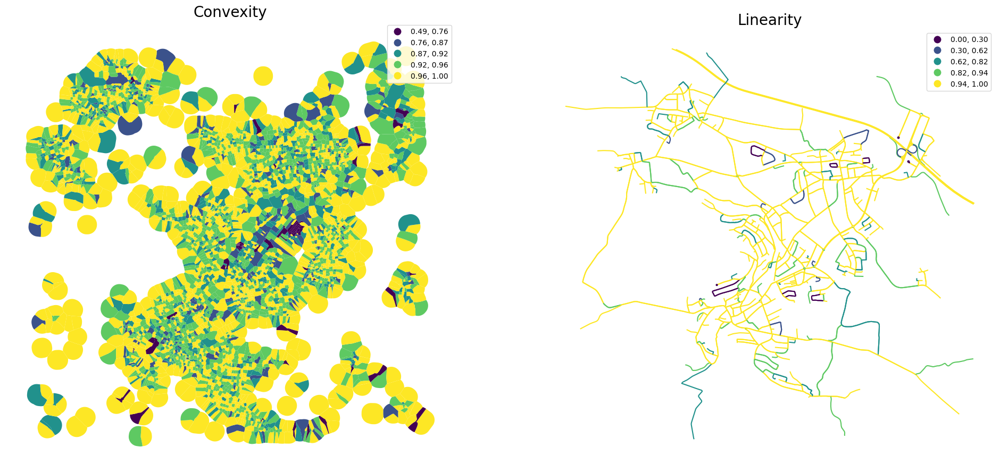

In [29]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("linearity", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Convexity', fontsize=20)
ax[1].set_title('Linearity', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Uzwil/convexity_and_linearity.svg')  

### Spatial distribution

In [30]:
buildings["shared_walls"] = momepy.SharedWallsRatio(buildings).series

/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/momepy/distribution.py:214: FutureWarning: Class based API like `momepy.SharedWalls` or `momepy.SharedWallsRatio` is deprecated. Replace it with `momepy.shared_walls` or explicitly computing `momepy.shared_walls / gdf.length` respectively to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  super().__init__(gdf)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/shapely/set_operations.py:133: RuntimeWarning: invalid value encountered in intersection
  return lib.intersection(a, b, **kwargs)


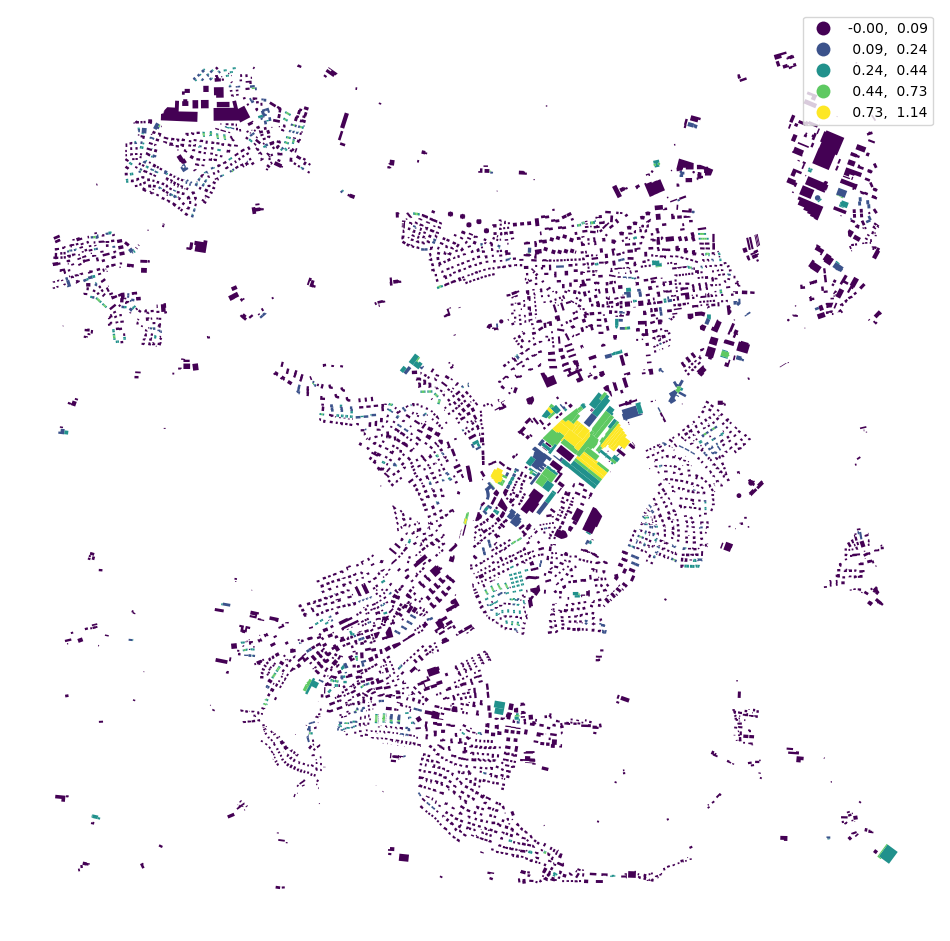

In [31]:
buildings.plot("shared_walls", figsize=(12, 12), scheme="natural_breaks", legend=True).set_axis_off()

plt.savefig('../results/Uzwil/sharedwalls.svg')  

Generate spatial weights matrix using `libpysal`.

In [32]:
queen_1 = libpysal.weights.contiguity.Queen.from_dataframe(tessellation, ids="uID", silence_warnings=True)

In [33]:
tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
    buildings["neighbor_distance"] = momepy.NeighborDistance(buildings, queen_1, "uID", verbose=False).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/1669107924.py:1: FutureWarning: Class based API like `momepy.Neighbors` is deprecated. Replace it with `momepy.neighbors` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  tessellation["neighbors"] = momepy.Neighbors(tessellation, queen_1, "uID", weighted=True, verbose=False).series
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/1669107924.py:2: FutureWarning: `momepy.CoveredArea` is deprecated. Replace it with `.describe()` method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation["covered_area"] = momepy.CoveredArea(tessellation, queen_1, "uID", verbose=False).series


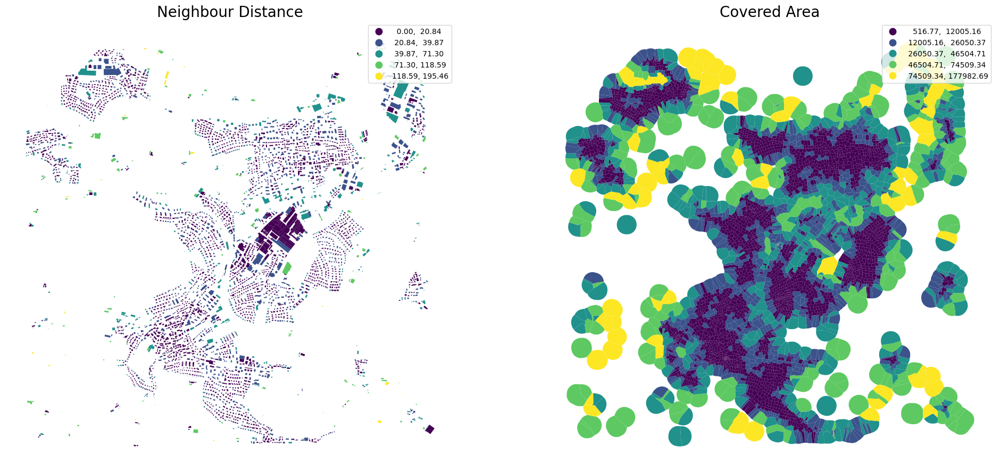

In [34]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

buildings.plot("neighbor_distance", ax=ax[0], scheme="natural_breaks", legend=True)
tessellation.plot("covered_area", ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Neighbour Distance', fontsize=20)
ax[1].set_title('Covered Area', fontsize=20)


ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Uzwil/neighbourdist_and_coveredarea.svg')  

In [35]:
queen_3 = momepy.sw_high(k=3, weights=queen_1)
buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)

buildings['interbuilding_distance'] = momepy.MeanInterbuildingDistance(buildings, queen_1, 'uID', queen_3, verbose=False).series
buildings['adjacency'] = momepy.BuildingAdjacency(buildings, queen_3, 'uID', buildings_q1, verbose=False).series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/3221532125.py:1: FutureWarning: `momepy.sw_high` is deprecated. Replace it with .higher_order() method of libpysal.graph.Graph or pin momepy version <1.0. This class will be removed in 1.0. 
  queen_3 = momepy.sw_high(k=3, weights=queen_1)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/3221532125.py:2: FutureWarning: `use_index` defaults to False but will default to True in future. Set True/False directly to control this behavior and silence this warning
  buildings_q1 = libpysal.weights.contiguity.Queen.from_dataframe(buildings, silence_warnings=True)
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/3221532125.py:4: FutureWarning: Class based API like `momepy.MeanInterbuildingDistance` is deprecated. Replace it with `momepy.mean_interbuilding_distance` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings['interbuilding_distance'] 

In [36]:
#fig, ax = plt.subplots(1, 2, figsize=(24, 12))
#
#buildings.plot("interbuilding_distance", ax=ax[0], scheme="natural_breaks", legend=True)
#buildings.plot("adjacency", ax=ax[1], scheme="natural_breaks", legend=True)
#
#ax[0].set_axis_off()
#ax[1].set_axis_off()

In [37]:
profile = momepy.StreetProfile(streets, buildings)
streets["width"] = profile.w
streets["width_deviation"] = profile.wd
streets["openness"] = profile.o

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/2648127835.py:1: FutureWarning: Class based API like `momepy.StreetProfile` is deprecated. Replace it with `momepy.street_profile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  profile = momepy.StreetProfile(streets, buildings)
/Users/mtwente/anaconda3/envs/maxvogt/lib/python3.11/site-packages/pandas/core/arraylike.py:492: RuntimeWarning: invalid value encountered in intersection
  return getattr(ufunc, method)(*new_inputs, **kwargs)


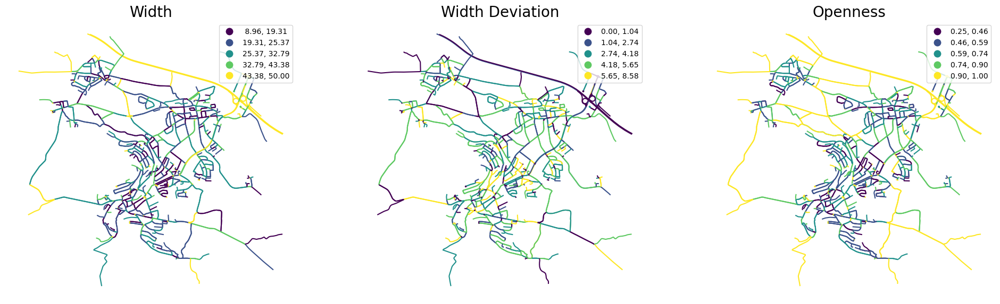

In [38]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

streets.plot("width", ax=ax[0], scheme="natural_breaks", legend=True)
streets.plot("width_deviation", ax=ax[1], scheme="natural_breaks", legend=True)
streets.plot("openness", ax=ax[2], scheme="natural_breaks", legend=True)

ax[0].set_title('Width', fontsize=20)
ax[1].set_title('Width Deviation', fontsize=20)
ax[2].set_title('Openness', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

plt.savefig('../results/Uzwil/road_network.svg')  

### Intensity

In [39]:
tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/1819725789.py:1: FutureWarning: `momepy.AreaRatio` is deprecated. Replace it with a direct division of areas or momepy.describe_agg() or pin momepy version <1.0. This class will be removed in 1.0. 
  tessellation['car'] = momepy.AreaRatio(tessellation, buildings, 'area', 'area', 'uID').series


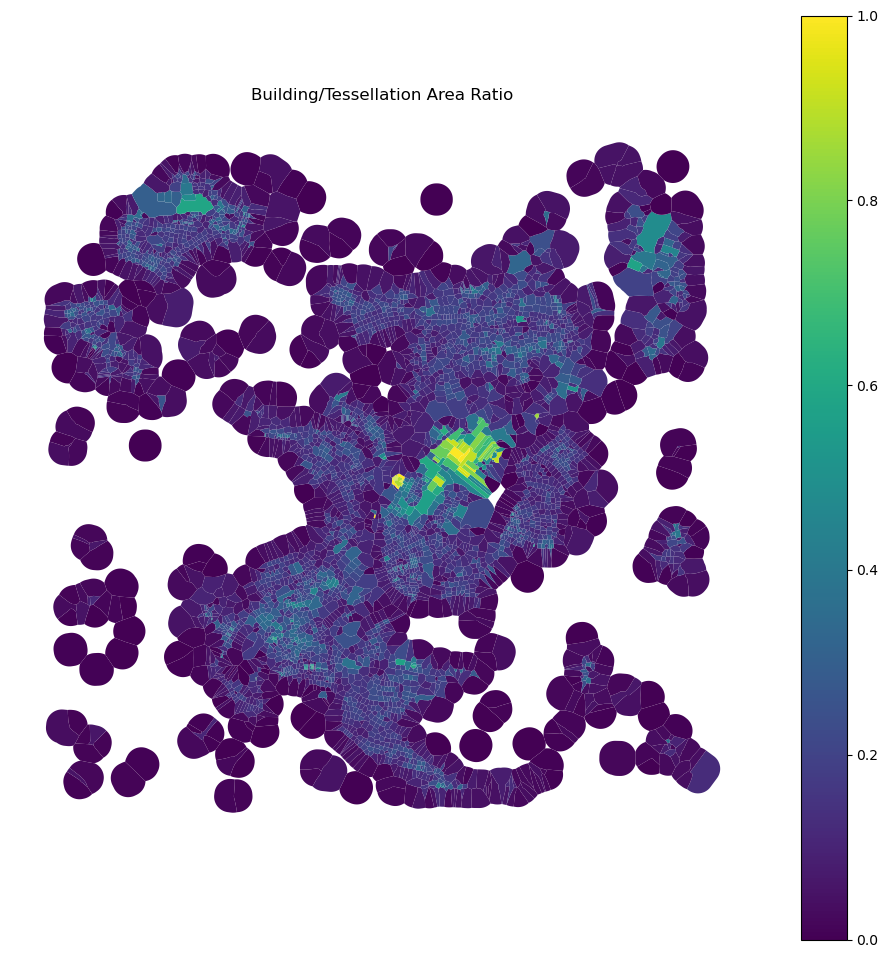

In [40]:
tessellation.plot("car", figsize=(12, 12), vmin=0, vmax=1, legend=True).set_axis_off()
plt.title("Building/Tessellation Area Ratio")

plt.savefig('../results/Uzwil/tessellation_ratio.svg')  

### Connectivity

In [41]:
graph = momepy.gdf_to_nx(streets)

In [42]:
graph = momepy.node_degree(graph)
graph = momepy.closeness_centrality(graph, radius=400, distance="mm_len")
graph = momepy.meshedness(graph, radius=400, distance="mm_len")

  0%|          | 0/654 [00:00<?, ?it/s]

  0%|          | 0/654 [00:00<?, ?it/s]

In [43]:
nodes, streets = momepy.nx_to_gdf(graph)

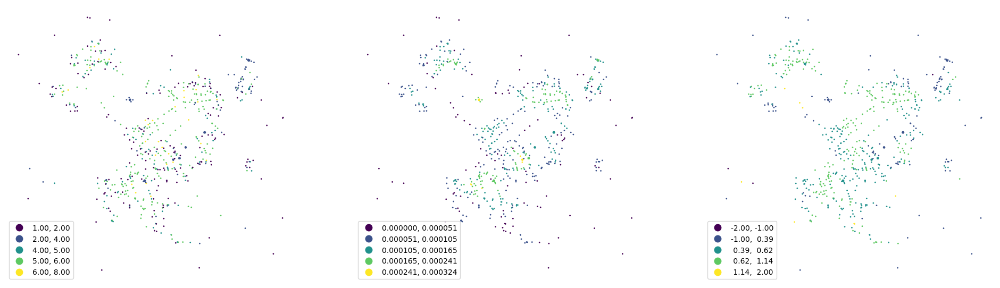

In [44]:
fig, ax = plt.subplots(1, 3, figsize=(24, 12))

nodes.plot("degree", ax=ax[0], scheme="natural_breaks", legend=True, markersize=1)
nodes.plot("closeness", ax=ax[1], scheme="natural_breaks", legend=True, markersize=1, legend_kwds={"fmt": "{:.6f}"})
nodes.plot("meshedness", ax=ax[2], scheme="natural_breaks", legend=True, markersize=1)

ax[0].set_axis_off()
ax[1].set_axis_off()
ax[2].set_axis_off()

plt.savefig('../results/Uzwil/connectivity.svg')  

In [45]:
buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/403706460.py:1: FutureWarning: Class based API like `momepy.get_node_id` is deprecated. Replace it with `momepy.get_nearest_node` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  buildings["nodeID"] = momepy.get_node_id(buildings, nodes, streets, "nodeID", "nID")


  0%|          | 0/4745 [00:00<?, ?it/s]

Link all data together (to tessellation cells or buildings).

In [46]:
tessellation

,uID,geometry,nID,area,convexity,neighbors,covered_area,car
0,3643,"POLYGON ((2727900.315 1253493.930, 2727911.030...",349,7399.070857,0.954349,0.013427,28300.972626,0.047912
1,4090,"POLYGON ((2727726.328 1253568.066, 2727665.012...",349,13222.793603,0.860685,0.015534,61180.946967,0.021644
2,3610,"POLYGON ((2727782.824 1253647.927, 2727781.831...",354,2268.400085,0.971794,0.024830,30214.480533,0.061433
3,3536,"POLYGON ((2727765.394 1253673.644, 2727762.878...",349,1787.360293,0.970096,0.022360,16856.994602,0.066714
4,3529,"POLYGON ((2727744.320 1253723.566, 2727744.173...",1301,1399.832559,0.906836,0.037284,17704.717794,0.120635
...,...,...,...,...,...,...,...,...
4740,3773,"POLYGON ((2729249.618 1257225.308, 2729249.104...",1368,1449.271650,0.970250,0.033339,40204.807385,0.171213
4741,3784,"POLYGON ((2729208.311 1257257.001, 2729205.445...",1368,14173.607528,0.966409,0.008425,42507.182748,0.044313
4742,1266,"POLYGON ((2728955.327 1257448.768, 2728959.014...",1368,24621.108239,0.878586,0.004532,77060.161047,0.017308
4743,1028,"POLYGON ((2729096.866 1257500.754, 2729096.496...",1368,9153.200615,0.972657,0.007507,77770.317814,0.045717


In [47]:
merged = tessellation.merge(buildings.drop(columns=['nID', 'geometry']), on='uID')
merged = merged.merge(streets.drop(columns='geometry'), on='nID', how='left')
merged = merged.merge(nodes.drop(columns='geometry'), on='nodeID', how='left')

In [48]:
merged.columns

Index(['uID', 'geometry', 'nID', 'area_x', 'convexity', 'neighbors',
       'covered_area', 'car', 'area_y', 'eri', 'elongation', 'shared_walls',
       'neighbor_distance', 'interbuilding_distance', 'adjacency', 'nodeID',
       'length', 'linearity', 'width', 'width_deviation', 'openness', 'mm_len',
       'node_start', 'node_end', 'x', 'y', 'degree', 'closeness',
       'meshedness'],
      dtype='object')

## Understanding the context

Measure first, second and third quartile of distribution of values within an area around each building.

In [49]:
percentiles = []
for column in merged.columns.drop(["uID", "nodeID", "nID", 'mm_len', 'node_start', 'node_end', "geometry"]):
    perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
    perc.columns = [f"{column}_" + str(x) for x in perc.columns]
    percentiles.append(perc)

/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API will be removed in 1.0. 
  perc = momepy.Percentiles(merged, column, queen_3, "uID", verbose=False).frame
/var/folders/vs/1r1r5k5x12v5dj0w9z79tj3c0000gn/T/ipykernel_47470/962013058.py:3: FutureWarning: Class based API like `momepy.Percentiles` is deprecated. Replace it with `momepy.percentile` to use functional API instead or pin momepy version <1.0. Class-based API

In [50]:
percentiles_joined = pandas.concat(percentiles, axis=1)

In [51]:
percentiles_joined

,area_x_25,area_x_50,area_x_75,convexity_25,convexity_50,convexity_75,neighbors_25,neighbors_50,neighbors_75,covered_area_25,...,y_75,degree_25,degree_50,degree_75,closeness_25,closeness_50,closeness_75,meshedness_25,meshedness_50,meshedness_75
0,894.645300,1335.585565,2603.312439,0.930244,0.956483,0.973282,0.024894,0.036643,0.052154,7851.716905,...,1.253631e+06,6.0,6.0,6.0,0.000070,0.000070,0.000070,0.529412,0.529412,0.529412
1,815.030856,1316.797118,1960.017555,0.934409,0.964288,0.977964,0.024958,0.039476,0.054900,7116.410010,...,1.253783e+06,5.0,6.0,6.0,0.000029,0.000068,0.000070,0.529412,0.533333,0.636364
2,863.839370,1354.374013,2268.400085,0.948486,0.969303,0.980989,0.024958,0.037640,0.053006,8741.639933,...,1.253783e+06,5.0,5.0,6.0,0.000029,0.000042,0.000070,0.529412,0.571429,0.636364
3,892.539980,1418.542805,2344.538498,0.951345,0.970131,0.983455,0.024894,0.037462,0.053973,8118.344292,...,1.253790e+06,1.0,5.0,6.0,0.000027,0.000042,0.000056,0.550420,0.571429,0.636364
4,847.784542,1206.005103,1935.309628,0.942912,0.969349,0.981452,0.025680,0.041840,0.053973,6525.027598,...,1.253797e+06,1.0,5.0,6.0,0.000027,0.000042,0.000042,0.571429,0.636364,0.636364
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4740,2096.340070,6429.597835,11101.380407,0.927088,0.938959,0.973333,0.012640,0.018201,0.026345,40136.212481,...,1.257250e+06,5.0,5.0,5.0,0.000094,0.000094,0.000094,0.360000,0.360000,0.360000
4741,2431.553995,8491.453504,14629.670844,0.928332,0.951312,0.978637,0.008648,0.014264,0.025464,41355.995067,...,1.257250e+06,5.0,5.0,5.0,0.000094,0.000094,0.000094,0.360000,0.360000,0.360000
4742,10747.424811,19642.626866,23203.381424,0.899229,0.954471,0.978299,0.004511,0.006390,0.007914,60281.889824,...,1.257680e+06,1.0,1.0,3.0,0.000000,0.000000,0.000047,-0.000000,-0.000000,0.180000
4743,11784.060688,19287.548482,23203.381424,0.923085,0.965268,0.990064,0.004511,0.006443,0.008597,61138.569059,...,1.257680e+06,1.0,1.0,5.0,0.000000,0.000000,0.000094,-0.000000,0.000000,0.360000


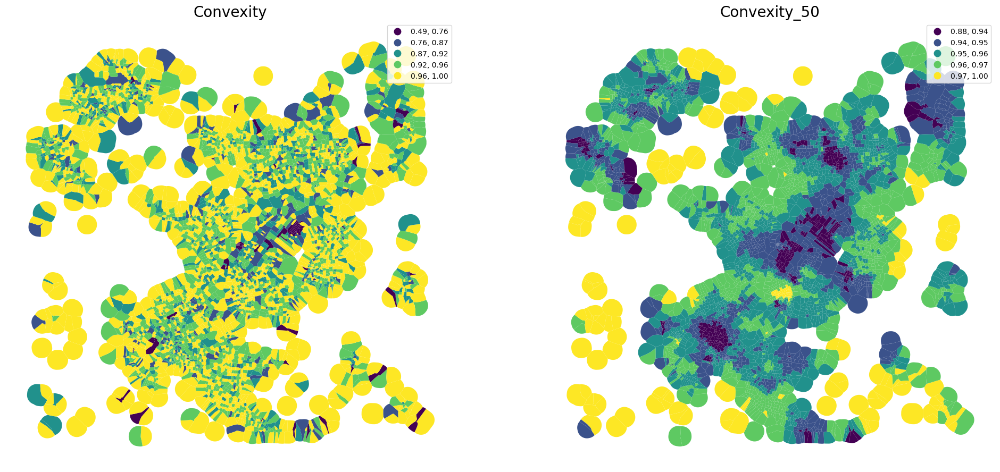

In [52]:
fig, ax = plt.subplots(1, 2, figsize=(24, 12))

tessellation.plot("convexity", ax=ax[0], scheme="natural_breaks", legend=True)
merged.plot(percentiles_joined['convexity_50'].values, ax=ax[1], scheme="natural_breaks", legend=True)

ax[0].set_title('Convexity', fontsize=20)
ax[1].set_title('Convexity_50', fontsize=20)

ax[0].set_axis_off()
ax[1].set_axis_off()

plt.savefig('../results/Uzwil/convexity.svg')  

## Clustering

Standardize values before clustering.

In [55]:
standardized = (percentiles_joined - percentiles_joined.mean()) / percentiles_joined.std()

In [56]:
standardized

,area_x_25,area_x_50,area_x_75,convexity_25,convexity_50,convexity_75,neighbors_25,neighbors_50,neighbors_75,covered_area_25,...,y_75,degree_25,degree_50,degree_75,closeness_25,closeness_50,closeness_75,meshedness_25,meshedness_50,meshedness_75
0,-0.044557,-0.109536,-0.091194,0.155069,-0.020917,-0.292904,-0.625133,-0.474555,-0.075386,-0.114084,...,-1.954989,0.900682,0.499495,0.017971,-0.365151,-0.744547,-1.042202,0.014253,-0.261257,-0.514287
1,-0.089724,-0.117520,-0.274000,0.369840,0.738490,0.366673,-0.619778,-0.249113,0.118290,-0.208434,...,-1.805843,0.347089,0.499495,0.017971,-1.239793,-0.773258,-1.042202,0.014253,-0.242956,-0.044275
2,-0.062034,-0.101553,-0.186367,1.095789,1.226492,0.792836,-0.619778,-0.395208,-0.015295,0.000104,...,-1.805843,0.347089,-0.373632,0.017971,-1.239793,-1.272976,-1.042202,0.014253,-0.065172,-0.044275
3,-0.045751,-0.074287,-0.164730,1.243222,1.307004,1.140303,-0.625133,-0.409386,0.052880,-0.079873,...,-1.799060,-1.867282,-0.373632,0.017971,-1.284617,-1.272976,-1.290481,0.112390,-0.065172,-0.044275
4,-0.071142,-0.164597,-0.281022,0.808352,1.230913,0.858049,-0.559413,-0.060913,0.052880,-0.284316,...,-1.792277,-1.867282,-0.373632,0.017971,-1.284617,-1.272976,-1.538760,0.210526,0.237869,-0.044275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4740,0.637194,2.054966,2.323719,-0.007677,-1.726040,-0.285658,-1.649764,-1.942459,-1.895302,4.028433,...,1.586962,0.347089,-0.373632,-1.191565,0.164334,-0.263415,-0.590090,-0.777118,-1.051874,-1.258786
4741,0.827369,2.931071,3.326360,0.056450,-0.524148,0.461508,-1.983551,-2.255860,-1.957429,4.184947,...,1.586962,0.347089,-0.373632,-1.191565,0.164334,-0.263415,-0.590090,-0.777118,-1.051874,-1.258786
4742,5.545163,7.669328,5.762768,-1.444357,-0.216735,0.413851,-2.329511,-2.882609,-3.194970,6.613384,...,2.007741,-1.867282,-3.866142,-3.610637,-1.859817,-2.102720,-1.454274,-2.458782,-2.731933,-2.049817
4743,6.133272,7.518452,5.762768,-0.214115,0.833879,2.071243,-2.329511,-2.878371,-3.146835,6.723307,...,2.007741,-1.867282,-3.866142,-1.191565,-1.859817,-2.102720,-0.590090,-2.458782,-2.731933,-1.258786


### How many clusters?

In [57]:
cgram = Clustergram(range(1, 12), n_init=10, random_state=0)
cgram.fit(standardized.fillna(0))

K=1 skipped. Mean computed from data directly.
K=2 fitted in 0.049 seconds.
K=3 fitted in 0.062 seconds.
K=4 fitted in 0.079 seconds.
K=5 fitted in 0.083 seconds.
K=6 fitted in 0.078 seconds.
K=7 fitted in 0.110 seconds.
K=8 fitted in 0.098 seconds.
K=9 fitted in 0.117 seconds.
K=10 fitted in 0.106 seconds.
K=11 fitted in 0.131 seconds.


Clustergram(k_range=range(1, 12), backend='sklearn', method='kmeans', kwargs={'n_init': 10, 'random_state': 0})

In [58]:
show(cgram.bokeh())

In [59]:
cgram.labels.head()

,1,2,3,4,5,6,7,8,9,10,11
0,0,0,0,1,4,4,5,7,3,3,6
1,0,0,0,1,4,4,5,7,3,3,6
2,0,0,0,1,4,4,5,7,3,3,6
3,0,0,1,1,4,4,5,7,3,3,6
4,0,0,0,1,4,4,5,7,3,3,6


In [60]:
merged["cluster"] = cgram.labels[8].values

In [61]:
urban_types = buildings[["geometry", "uID"]].merge(merged[["uID", "cluster"]], on="uID")

In [62]:
urban_types.explore("cluster", categorical=True, prefer_canvas=True, tiles="CartoDB Positron", tooltip=False)

## Export

Save cluster output geodata to geojson file:

In [63]:
urban_types.to_file('../data/raw/Uzwil.geojson', driver='GeoJSON')

## Utilities

Once you run the cell below, it hides all cells below the currently active one (aka presentation mode).

In [ ]:
%%html
<style>
.jp-Cell.jp-mod-selected ~ .jp-Cell {
    display: none;
}
</style>

Run this cell to turn the presentation mode off.

In [ ]:
%%html
<style>
.jp-Cell.jp-mod-selected ~ .jp-Cell {
    display: block;
}
</style>